## wallpaper

In [2]:
import os
from glob import glob
import pandas as pd
import numpy as np
import seaborn as sns
import pickle

from PIL import Image
from tqdm import tqdm
import random
import cv2
import matplotlib
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
import re

wallpaper_df = pd.read_csv("./wallpaper/results/jybest.csv", encoding='utf-8')
wallpaper_df

,id,label
0,TEST_000,훼손
1,TEST_001,오염
2,TEST_002,훼손
3,TEST_003,훼손
4,TEST_004,오염
...,...,...
787,TEST_787,오염
788,TEST_788,훼손
789,TEST_789,오염
790,TEST_790,오염


In [3]:
print ('버전: ', matplotlib.__version__)
print ('설치 위치: ', matplotlib.__file__)
print ('설정 위치: ', matplotlib.get_configdir())
print ('캐시 위치: ', matplotlib.get_cachedir())
print ('설정파일 위치: ', matplotlib.matplotlib_fname())

버전:  3.7.1
설치 위치:  C:\Users\user\anaconda3\envs\DACON\lib\site-packages\matplotlib\__init__.py
설정 위치:  C:\Users\user\.matplotlib
캐시 위치:  C:\Users\user\.matplotlib
설정파일 위치:  C:\Users\user\anaconda3\envs\DACON\lib\site-packages\matplotlib\mpl-data\matplotlibrc


In [4]:
# 한글 깨짐 고치는 법
# https://operstu1.tistory.com/80

# 원래 폰트: sans-serif
# 변경 폰트: Malgun Gothic

392


In [5]:
image_path = './wallpaper/test'
paths = [os.path.join(image_path, i) for i in os.listdir(image_path) if re.search(".png$", i)]

In [6]:
wallpaper_df['path'] = paths
wallpaper_df.head()

,id,label,path
0,TEST_000,훼손,./wallpaper/test\000.png
1,TEST_001,오염,./wallpaper/test\001.png
2,TEST_002,훼손,./wallpaper/test\002.png
3,TEST_003,훼손,./wallpaper/test\003.png
4,TEST_004,오염,./wallpaper/test\004.png


In [7]:
# image=Image.open(wallpaper_df['path'][0])
# image.show()

In [8]:
def plot_images(df, label):
    plt.figure(figsize = (12,12))
    species_df = df[df['label'] == label].reset_index(drop = True)
    plt.suptitle(label)
    for idx, i in enumerate(np.random.choice(species_df['path'], 32)):
        plt.subplot(8,8,idx+1)
        image_path = i
        img = Image.open(image_path)
        img = img.resize((224,224))
        plt.imshow(img)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

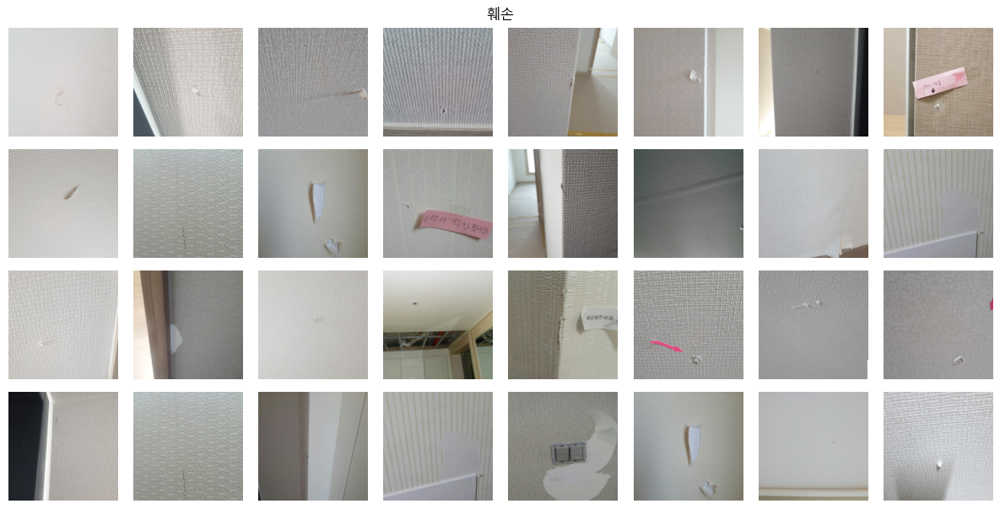

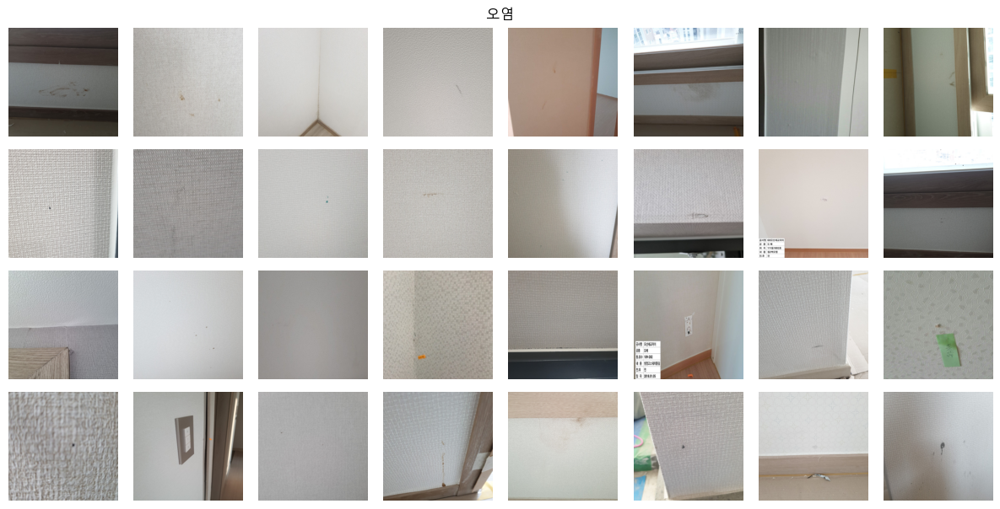

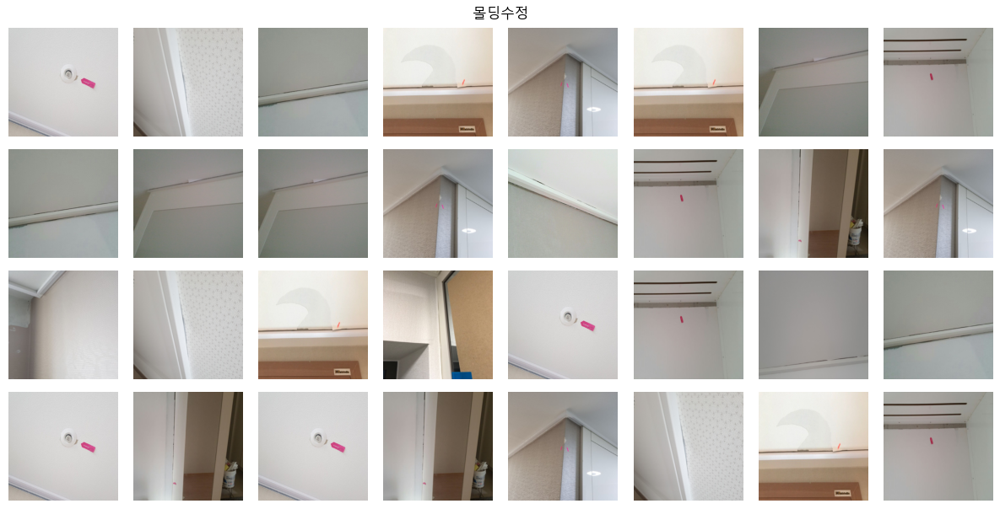

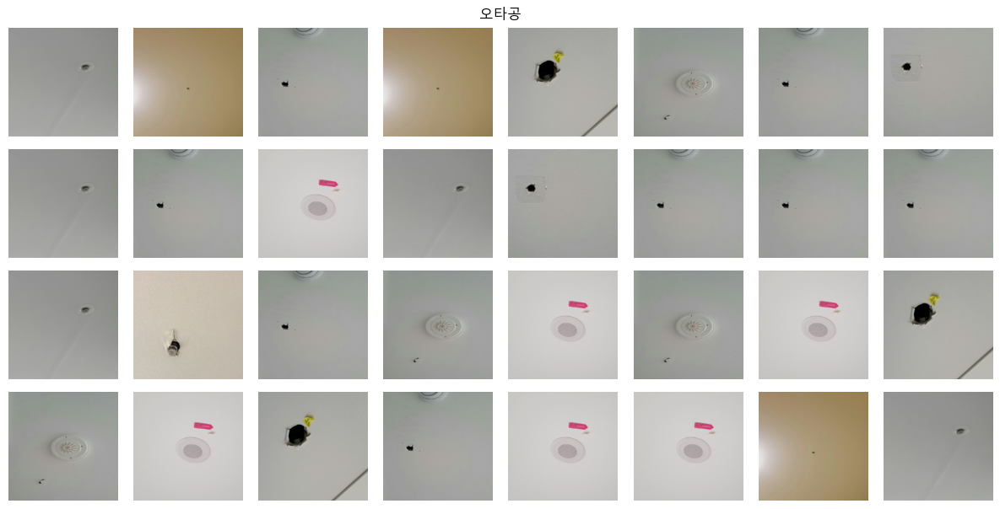

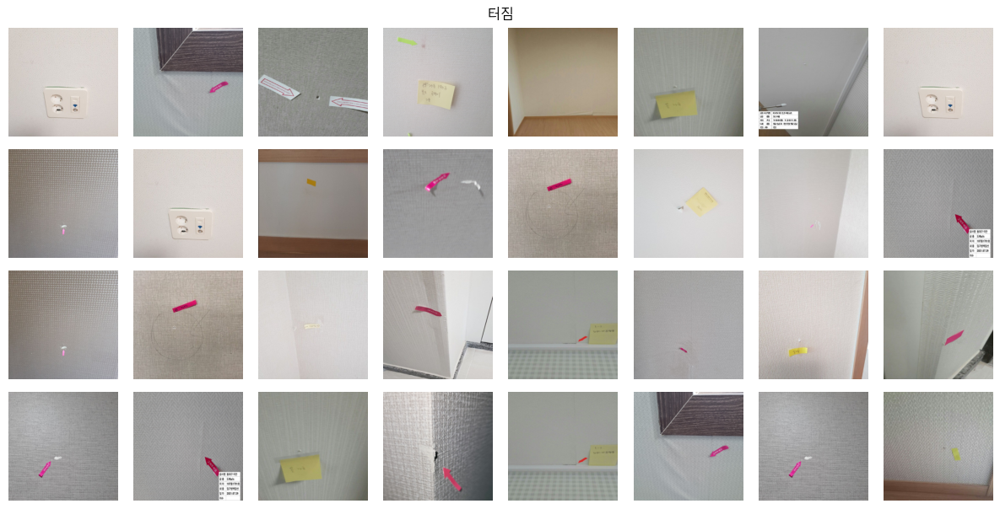

...

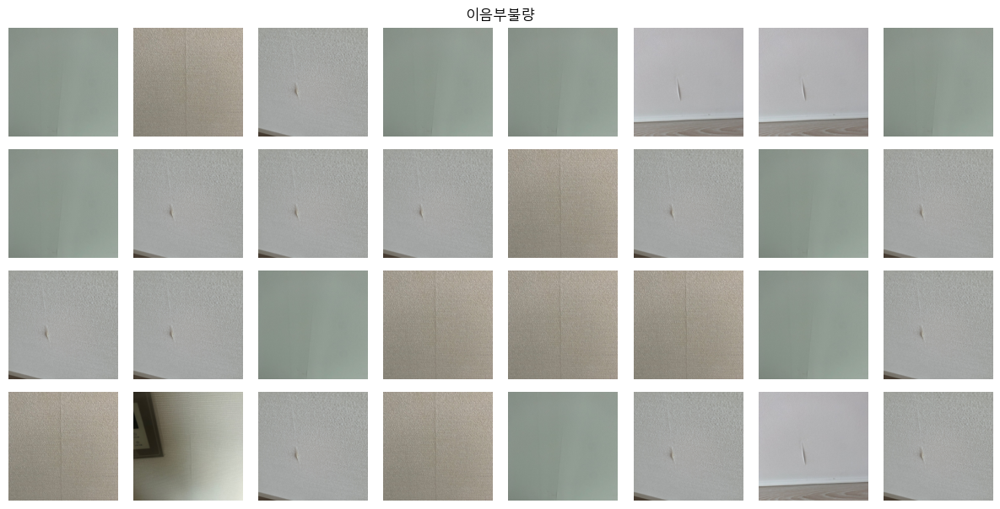

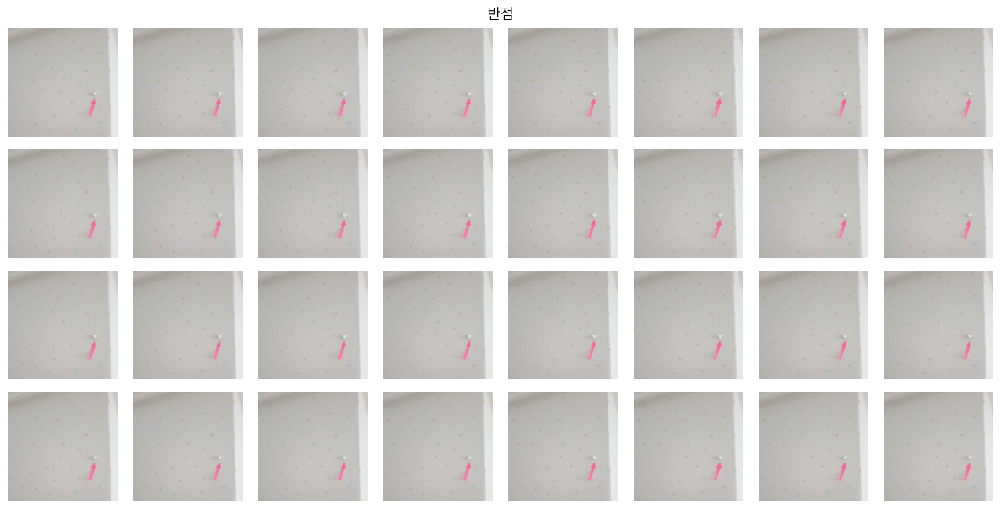

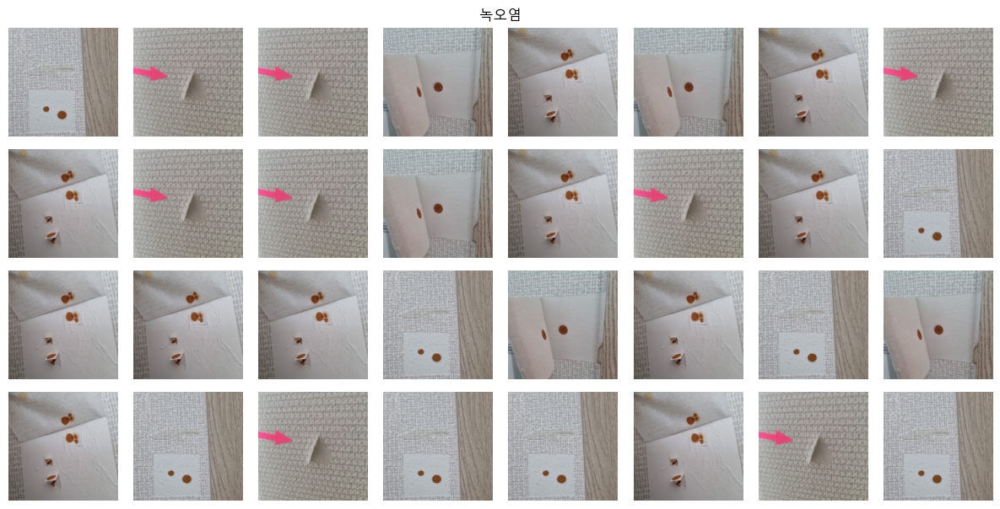

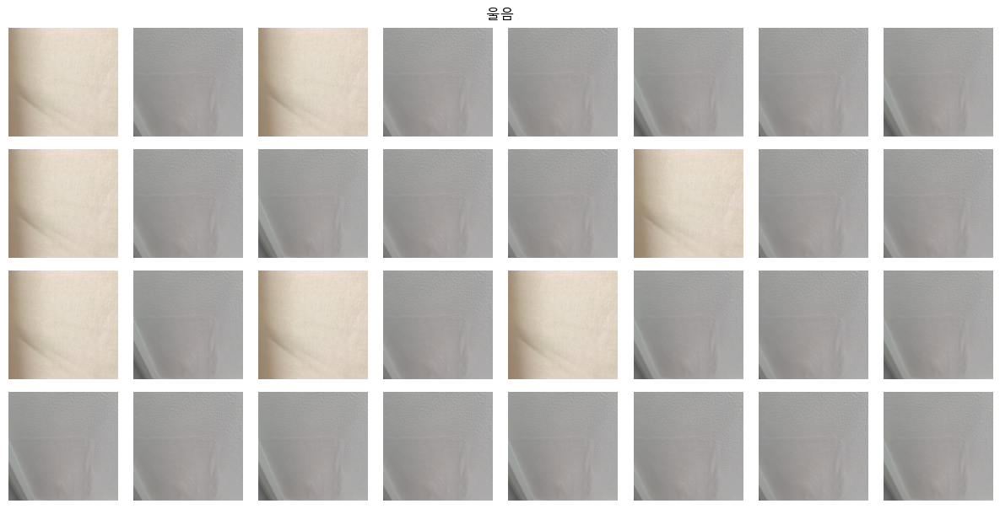

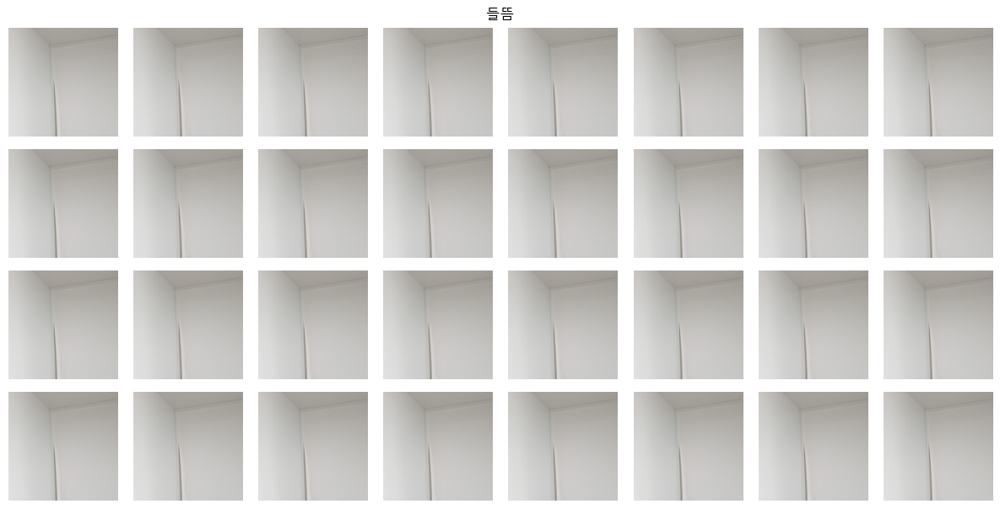

In [9]:
for la in wallpaper_df['label'].unique():
    plot_images(wallpaper_df , label=la)

## Car Detection

In [13]:
car_df = pd.read_csv("./car_detection/results/jy_best.csv", encoding='utf-8')
car_df.head()

,file_name,class_id,confidence,point1_x,point1_y,point2_x,point2_y,point3_x,point3_y,point4_x,point4_y
0,121727180.png,11,0.984091,791,126,1064,126,1064,459,791,459
1,074120765.png,31,0.913239,1108,124,1374,124,1374,395,1108,395
2,074120765.png,33,0.720051,1109,126,1374,126,1374,393,1109,393
3,074120765.png,32,0.526703,1110,126,1373,126,1373,391,1110,391
4,120216554.png,6,0.982314,726,101,983,101,983,342,726,342


In [23]:
car_dict = {0: 'chevrolet_malibu_sedan_2012_2016', 1: 'chevrolet_malibu_sedan_2017_2019', 2: 'chevrolet_spark_hatchback_2016_2021', 3: 'chevrolet_trailblazer_suv_2021_', 4: 'chevrolet_trax_suv_2017_2019', 5: 'genesis_g80_sedan_2016_2020', 6: 'genesis_g80_sedan_2021_', 7: 'genesis_gv80_suv_2020_', 8: 'hyundai_avante_sedan_2011_2015', 9: 'hyundai_avante_sedan_2020_', 10: 'hyundai_grandeur_sedan_2011_2016', 11: 'hyundai_grandstarex_van_2018_2020', 12: 'hyundai_ioniq_hatchback_2016_2019', 13: 'hyundai_sonata_sedan_2004_2009', 14: 'hyundai_sonata_sedan_2010_2014', 15: 'hyundai_sonata_sedan_2019_2020', 16: 'kia_carnival_van_2015_2020', 17: 'kia_carnival_van_2021_', 18: 'kia_k5_sedan_2010_2015', 19: 'kia_k5_sedan_2020_', 20: 'kia_k7_sedan_2016_2020', 21: 'kia_mohave_suv_2020_', 22: 'kia_morning_hatchback_2004_2010', 23: 'kia_morning_hatchback_2011_2016', 24: 'kia_ray_hatchback_2012_2017', 25: 'kia_sorrento_suv_2015_2019', 26: 'kia_sorrento_suv_2020_', 27: 'kia_soul_suv_2014_2018', 28: 'kia_sportage_suv_2016_2020', 29: 'kia_stonic_suv_2017_2019', 30: 'renault_sm3_sedan_2015_2018', 31: 'renault_xm3_suv_2020_', 32: 'ssangyong_korando_suv_2019_2020', 33: 'ssangyong_tivoli_suv_2016_2020'}

In [68]:
from PIL import Image, ImageDraw, ImageFont

num = 178
image_path = "./car_detection/dataset/test/" + car_df['file_name'][num]
img = Image.open(image_path).convert('RGB')
text_xy = (car_df['point4_x'][num],car_df['point4_y'][num])

font_size = 20
font = ImageFont.truetype("arial.ttf", font_size) # arial.ttf 글씨체, font_size=15

draw = ImageDraw.Draw(img)
draw.rectangle((car_df['point1_x'][num],car_df['point1_y'][num],car_df['point3_x'][num],car_df['point3_y'][num]), outline=(255,0,0), width = 7)
draw.text(text_xy, car_dict[car_df['class_id'][num]], (0,0,0), font=font)
img.show()

## DeepFake

In [102]:
fake_df = pd.read_csv("./deepfake/result.csv", encoding='utf-8')
fake_df

,ImageId,answer
0,test_00000.png,1
1,test_00001.png,0
2,test_00002.png,1
3,test_00003.png,0
4,test_00004.png,0
...,...,...
58343,test_58343.png,1
58344,test_58344.png,0
58345,test_58345.png,0
58346,test_58346.png,1


In [104]:
image_path = './deepfake/test/images'
paths = [os.path.join(image_path, i) for i in os.listdir(image_path) if re.search(".png$", i)]

fake_df['path'] = paths
fake_df.head()

,ImageId,answer,path
0,test_00000.png,1,./deepfake/test/images\test_00000.png
1,test_00001.png,0,./deepfake/test/images\test_00001.png
2,test_00002.png,1,./deepfake/test/images\test_00002.png
3,test_00003.png,0,./deepfake/test/images\test_00003.png
4,test_00004.png,0,./deepfake/test/images\test_00004.png


In [113]:
def plot_images(df, label):
    plt.figure(figsize = (12,12))
    species_df = df[df['answer'] == label].reset_index(drop = True)
    if label == 0:
        title = "Real"
    else:
        title = "Fake"
    plt.suptitle(title)
    for idx, i in enumerate(np.random.choice(species_df['path'], 32)):
        plt.subplot(8,8,idx+1)
        image_path = i
        img = Image.open(image_path)
        img = img.resize((224,224))
        plt.imshow(img)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

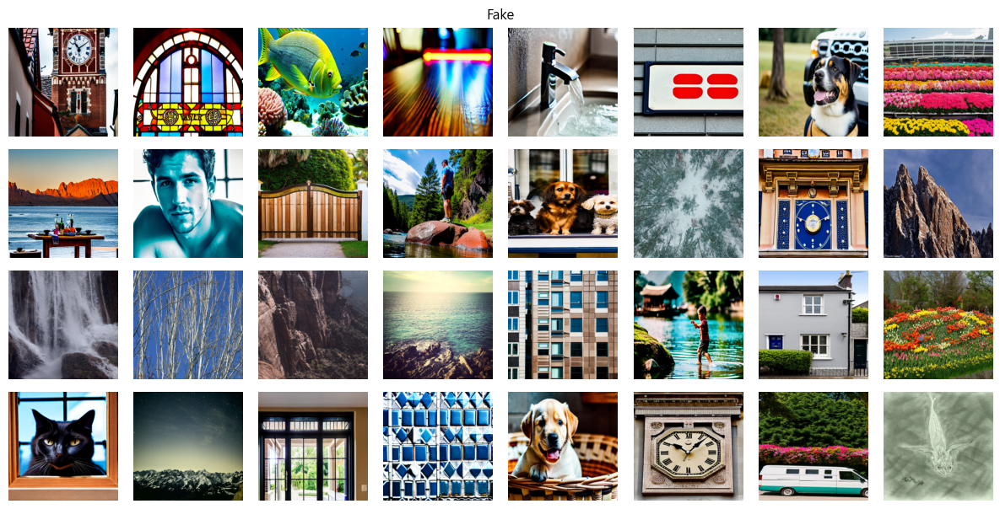

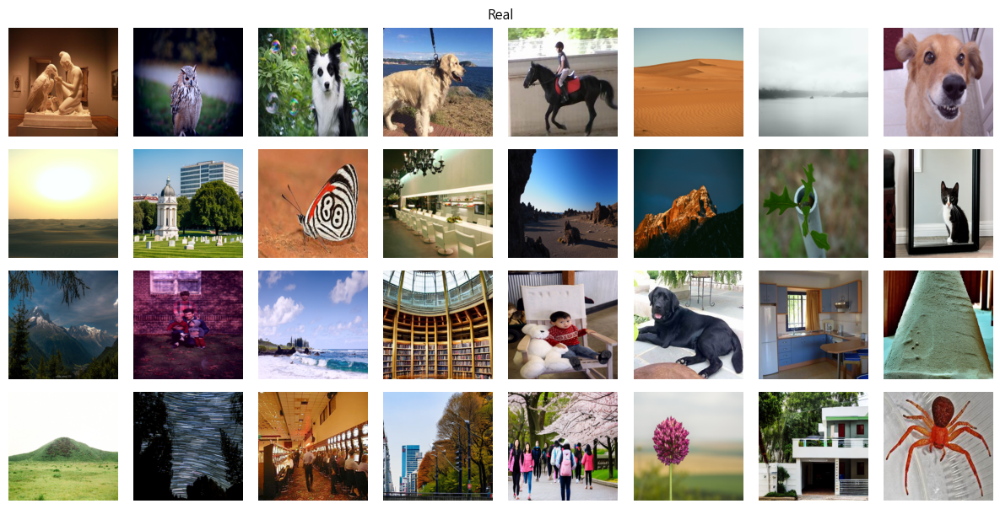

In [114]:
for la in fake_df['answer'].unique():
    plot_images(fake_df, la)

## Multi-Modal

In [136]:
answer_df = pd.read_csv("./multi_modal/open/test.csv")
answer_df.head()

,ID,image_id,question
0,TEST_00000,test_00000,Is this a trade show?
1,TEST_00001,test_00001,Where are the people?
2,TEST_00002,test_00002,What color is the ski suit?
3,TEST_00003,test_00003,What color are the cabinets?
4,TEST_00004,test_00004,Is there a person standing in the background?


In [137]:
modal_df = pd.read_csv("./multi_modal/dacon_vqa/results/jy_best.csv")
modal_df.head()

,ID,answer
0,TEST_00000,no
1,TEST_00001,beach
2,TEST_00002,red
3,TEST_00003,brown
4,TEST_00004,yes


In [139]:
answer_df['answer'] = modal_df['answer']
# answer_df = answer_df.drop('image_id', axis=1)
answer_df

,ID,image_id,question,answer
0,TEST_00000,test_00000,Is this a trade show?,no
1,TEST_00001,test_00001,Where are the people?,beach
2,TEST_00002,test_00002,What color is the ski suit?,red
3,TEST_00003,test_00003,What color are the cabinets?,brown
4,TEST_00004,test_00004,Is there a person standing in the background?,yes
...,...,...,...,...
40474,TEST_40474,test_09502,What is the man with the camera using?,phone
40475,TEST_40475,test_09782,What is graffiti on the train?,graffiti
40476,TEST_40476,test_08648,Is this vehicle traveling through the air or t...,air
40477,TEST_40477,test_02416,What color is the blanket on the back of the e...,blue


In [192]:
from PIL import Image, ImageDraw, ImageFont

num = 124
image_path = "./multi_modal/dataset/test/" + answer_df['image_id'][num] + ".jpg"
img = Image.open(image_path).convert('RGB')
text_xy1 = (0, 0)
text_xy2 = (0, 25)
Q_text = "Q) " + answer_df['question'][num]
A_text = "A) " + answer_df['answer'][num]

font_size = 25
font = ImageFont.truetype("arial.ttf", font_size) # arial.ttf 글씨체, font_size=15

draw = ImageDraw.Draw(img)
draw.text(text_xy1, Q_text, (0,0,0), font=font)
draw.text(text_xy2, A_text, (0,0,0), font=font)
img.show()